In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import mne
import matplotlib.pyplot as plt
import ghibtools as gh
import pandas as pd
import seaborn as sns
from params import *
from bibliotheque import get_pos
from compute_hilbert_resp_mi import hilbert_resp_mi_job
import mne

In [10]:
concat = []
for run_key in run_keys:
    participant = run_key.split('_')[0]
    hilbert_resp_mi_participant = hilbert_resp_mi_job.get(run_key).to_dataframe()
    concat.append(hilbert_resp_mi_participant)
hilbert_mi = pd.concat(concat)

hilbert_resp_mi is processing ('P02_ses03',)
Erreur processing hilbert_resp_mi ('P02_ses03',)


AttributeError: 'NoneType' object has no attribute 'to_dataframe'

In [5]:
hilbert_mi

,participant,odor,session,state,bloc,trial,chan,band,mi_real_sum,mi_real_mean,mi_abs,mi_abs_sum,mi_abs_mean
0,P01,odor_o,ses03,33,Free,1,Fp1,delta,-0.000419,-0.000838,0.000839,0.000419,0.000838
1,P01,odor_o,ses03,33,Free,1,Fp1,theta,-0.022261,-0.044019,0.045536,0.022261,0.044019
2,P01,odor_o,ses03,33,Free,1,Fp1,alpha,-0.034101,-0.067028,0.070611,0.034101,0.067028
3,P01,odor_o,ses03,33,Free,1,Fp1,beta,-0.014026,-0.027851,0.028451,0.014026,0.027851
4,P01,odor_o,ses03,33,Free,1,Fp1,low_gamma,-0.016341,-0.032409,0.033224,0.016341,0.032409
...,...,...,...,...,...,...,...,...,...,...,...,...,...
255745,P28,odor_-,ses04,29,Fast,3,Fp2,high_gamma,-0.042619,-0.084669,0.089031,0.042619,0.084669
255746,P28,odor_-,ses04,29,Fast,3,Fp2,100_200,-0.070020,-0.138514,0.150585,0.070020,0.138514
255747,P28,odor_-,ses04,29,Fast,3,Fp2,200_300,-0.061449,-0.121722,0.130945,0.061449,0.121722
255748,P28,odor_-,ses04,29,Fast,3,Fp2,300_400,-0.061933,-0.122670,0.132044,0.061933,0.122670


<AxesSubplot: >

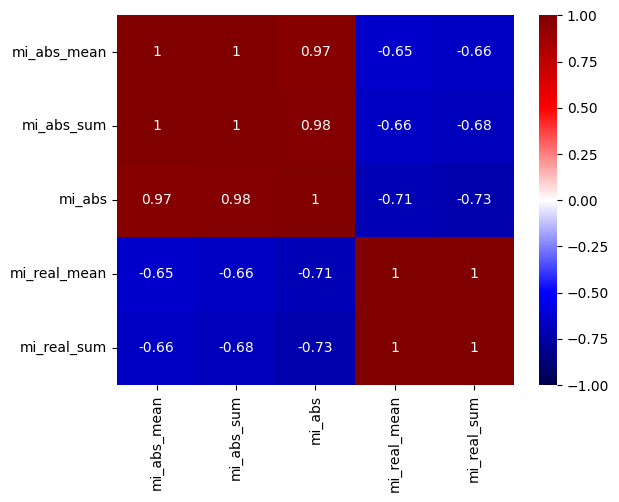

In [33]:
sns.heatmap(hilbert_mi[['hilbert_mi_abs_mean','hilbert_mi_abs_sum','hilbert_mi_abs','hilbert_mi_real_mean','hilbert_mi_real_sum']].corr(), annot = True, vmin = -1 , vmax = 1, cmap = 'seismic')

<AxesSubplot: xlabel='band', ylabel='mi_real_sum'>

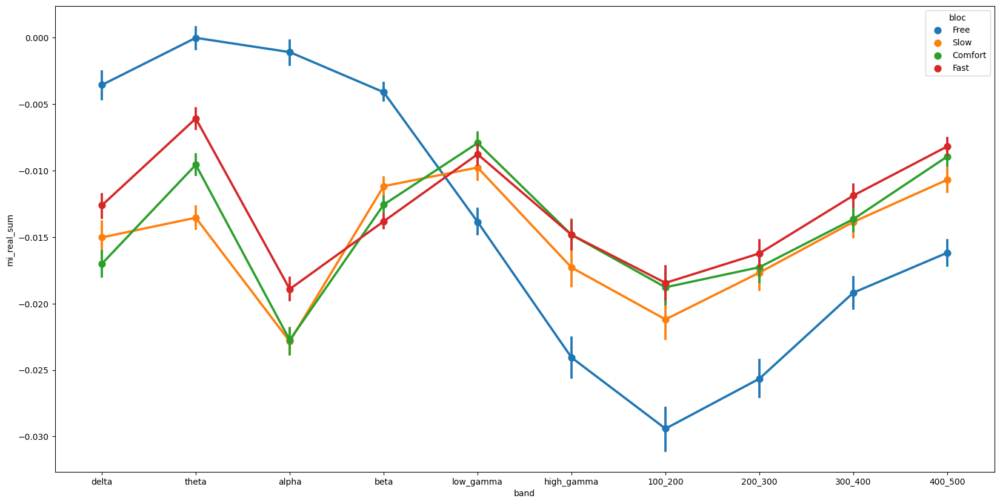

In [6]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=hilbert_mi, x = 'band', y = 'mi_real_sum', hue = 'bloc',ax=ax)

In [46]:
mask = (hilbert_mi['band'] == '100_200') & (hilbert_mi['chan'] == 'FC5')

<AxesSubplot: xlabel='bloc', ylabel='mi_abs_sum'>

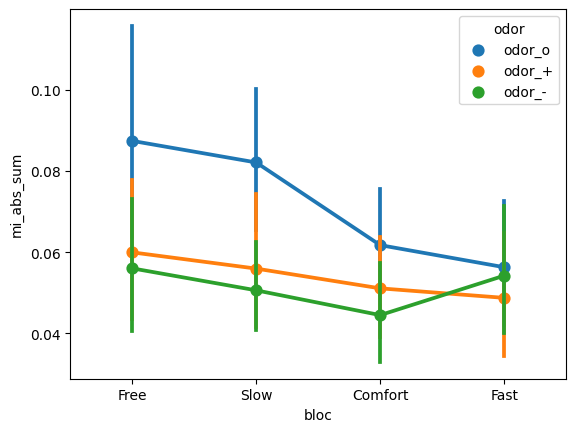

In [51]:
sns.pointplot(data = hilbert_mi[mask], x = 'bloc', y = 'mi_abs_sum', hue = 'odor')

/home/valentin.ghibaudo/.virtualenvs/py3.10_nodegpu/lib/python3.10/site-packages/pingouin/distribution.py:515: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(


<AxesSubplot: title={'center': 'Effect of bloc * odor on mi_real_sum : ns \n rm_anova : pcorr-0.581, np2 : 0.027 (S) \n p-bloc-0.14 , p-odor-0.062'}, xlabel='bloc', ylabel='mi_real_sum'>

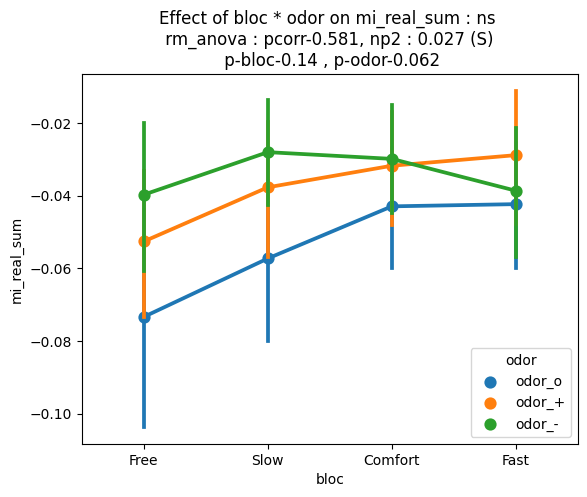

In [53]:
gh.auto_stats(df = hilbert_mi[mask], predictor = ['bloc','odor'] , outcome = 'mi_real_sum', subject = 'participant')

<AxesSubplot: xlabel='bloc', ylabel='mi_real_sum'>

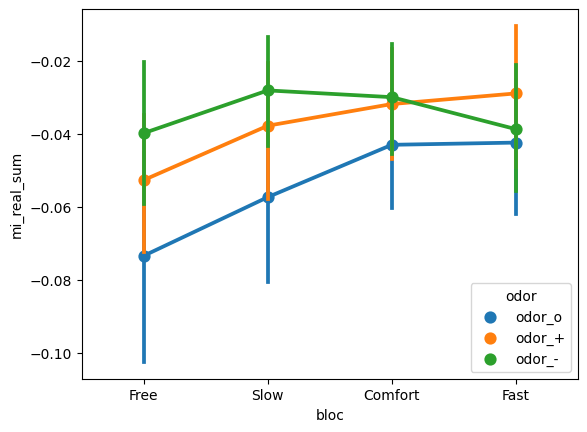

In [52]:
sns.pointplot(data = hilbert_mi[mask], x = 'bloc', y = 'mi_real_sum', hue = 'odor')

<AxesSubplot: xlabel='band', ylabel='mi_real_mean'>

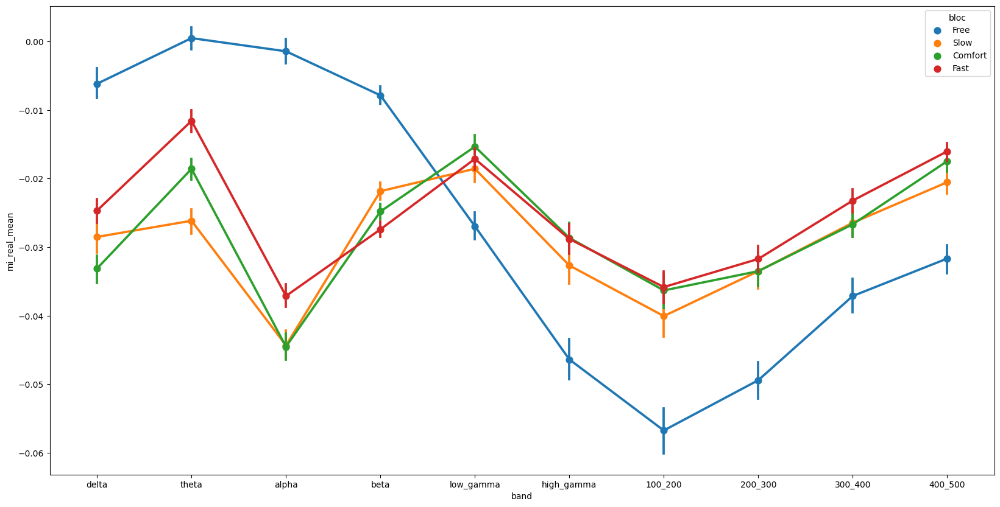

In [49]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=hilbert_mi, x = 'band', y = 'mi_real_mean', hue = 'bloc',ax=ax)

<AxesSubplot: xlabel='band', ylabel='mi_abs'>

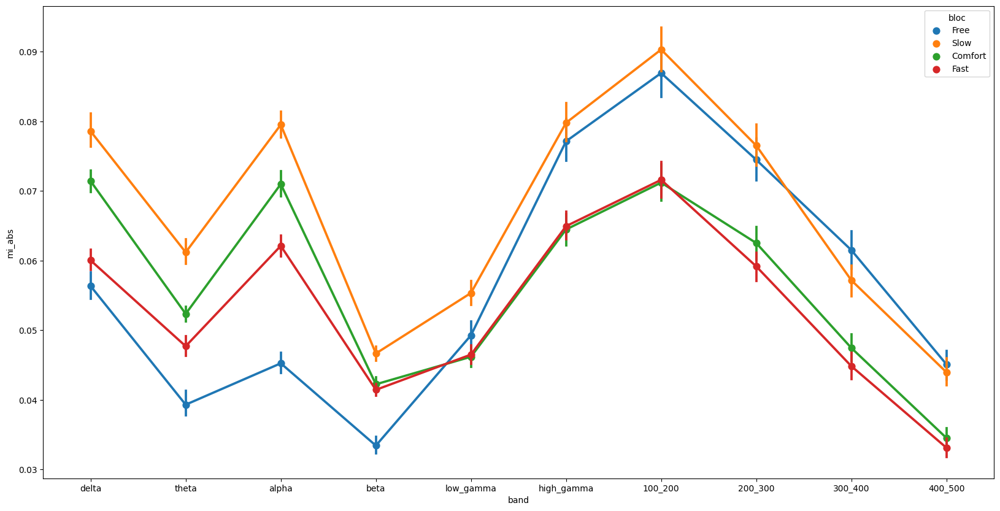

In [8]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=hilbert_mi, x = 'band', y = 'mi_abs', hue = 'bloc',ax=ax)

<AxesSubplot: xlabel='band', ylabel='mi_abs_sum'>

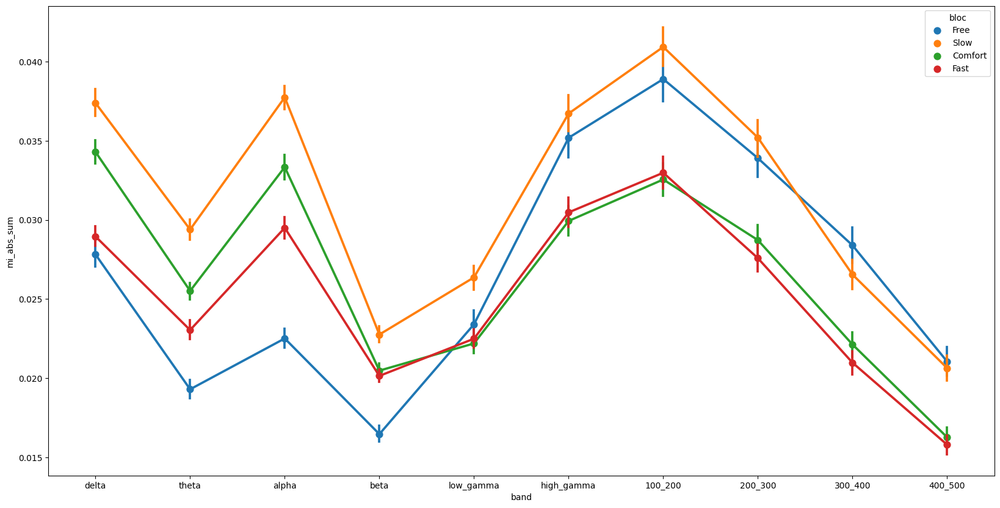

In [9]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=hilbert_mi, x = 'band', y = 'abs_sum', hue = 'bloc',ax=ax)

<AxesSubplot: xlabel='band', ylabel='mi_abs_mean'>

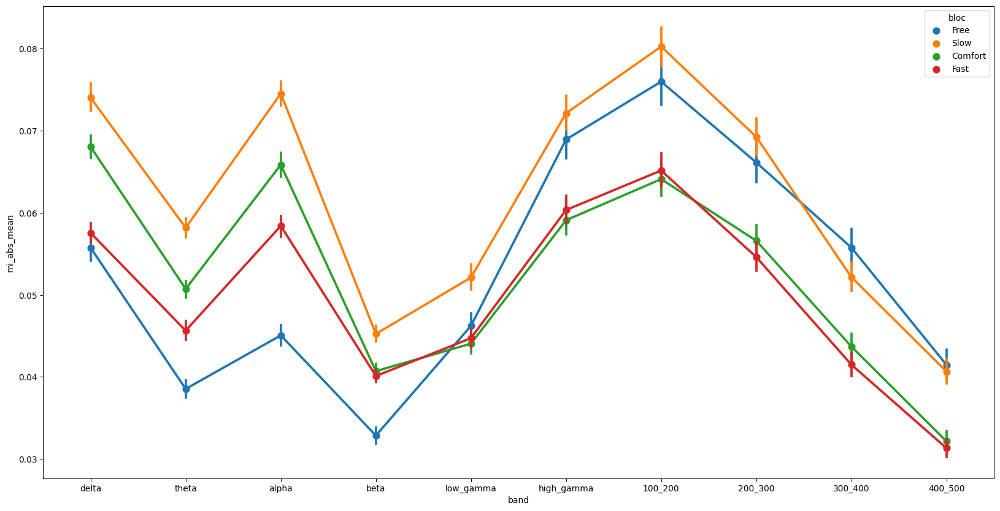

In [10]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=hilbert_mi, x = 'band', y = 'mi_abs_mean', hue = 'bloc',ax=ax)

delta (0.00041529753055954277, 0.38633249110746853)
theta (0.00032544828291768466, 0.29291972920666676)
alpha (0.00044520108120330146, 0.3816421332308848)
beta (0.0002854214753132456, 0.2214236127674319)
low_gamma (0.0002598807158760194, 0.3959583627933072)
high_gamma (0.0002719758069932127, 0.6280551980980432)
100_200 (0.00021114993557037895, 0.7436551238171215)
200_300 (0.00020670076840531175, 0.6237367525981229)
300_400 (0.00015031159566040862, 0.5251844298481422)
400_500 (0.0001464739880577051, 0.44316560173950775)


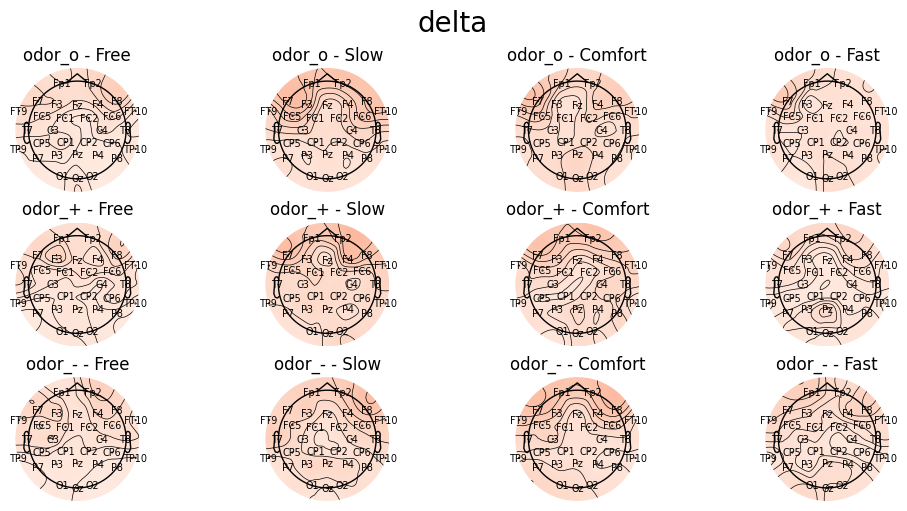

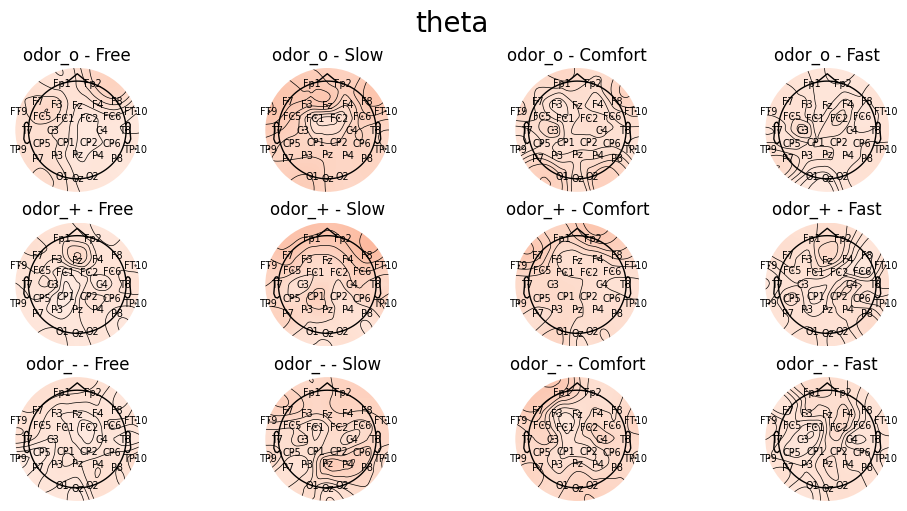

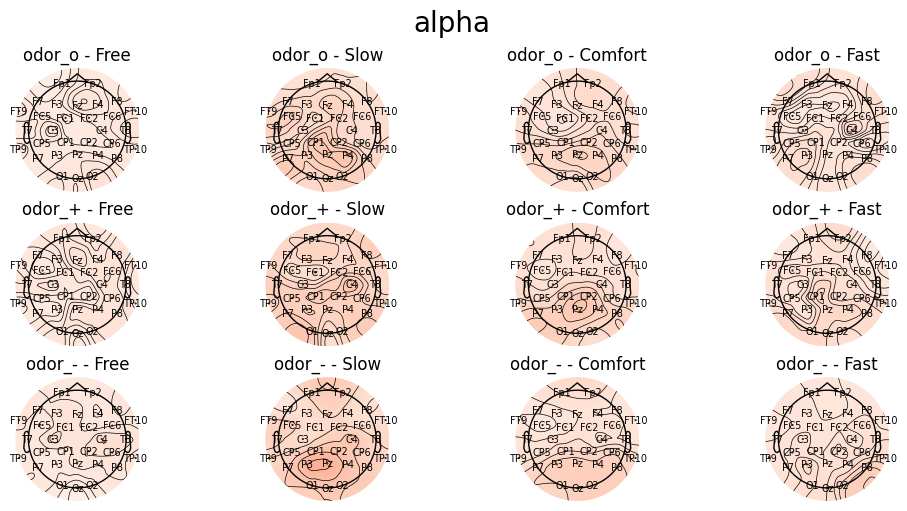

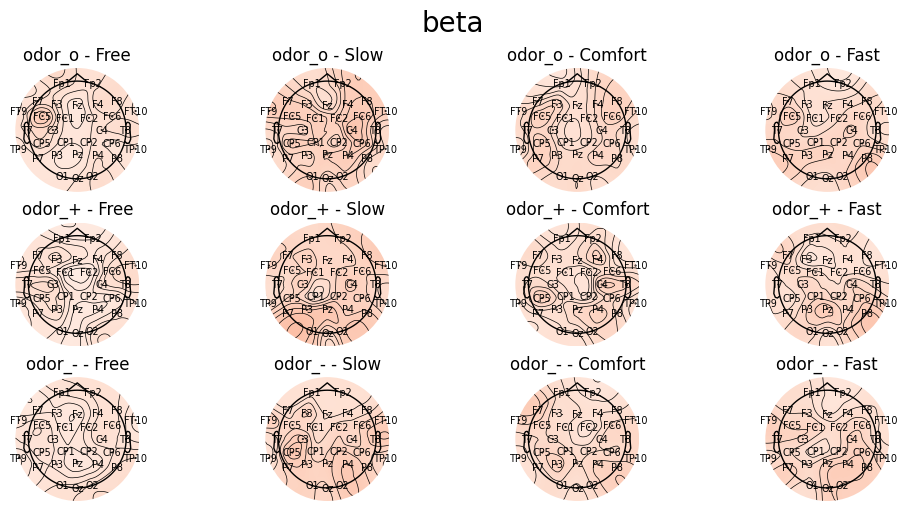

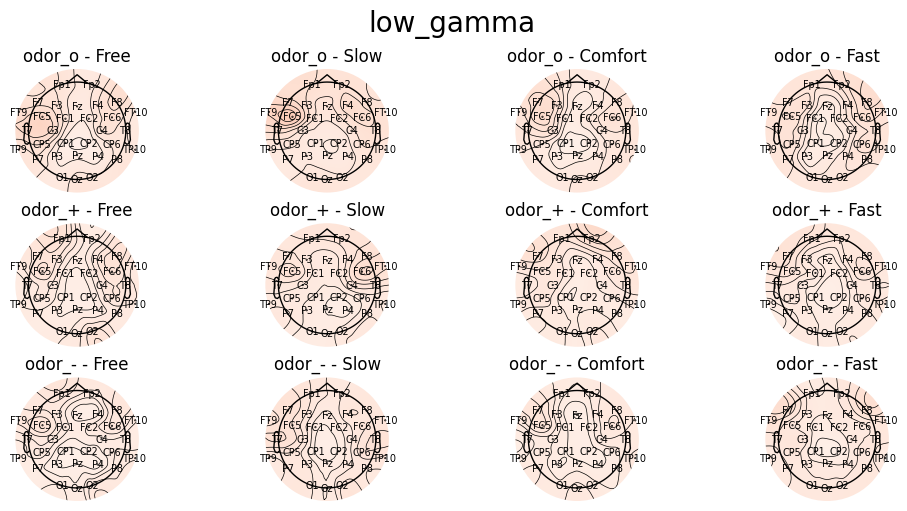

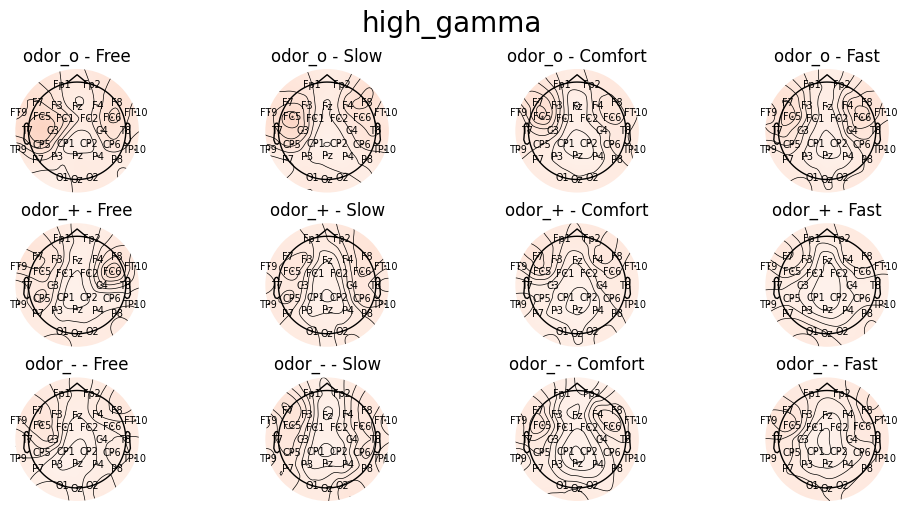

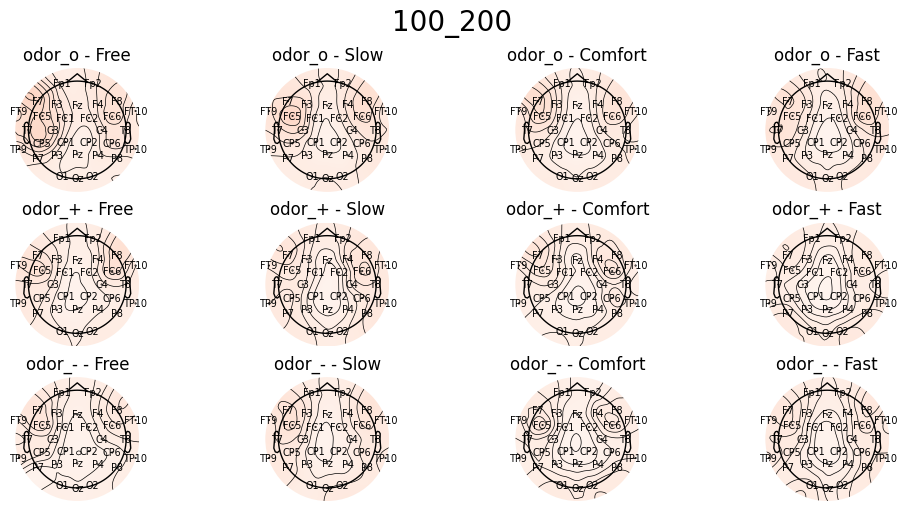

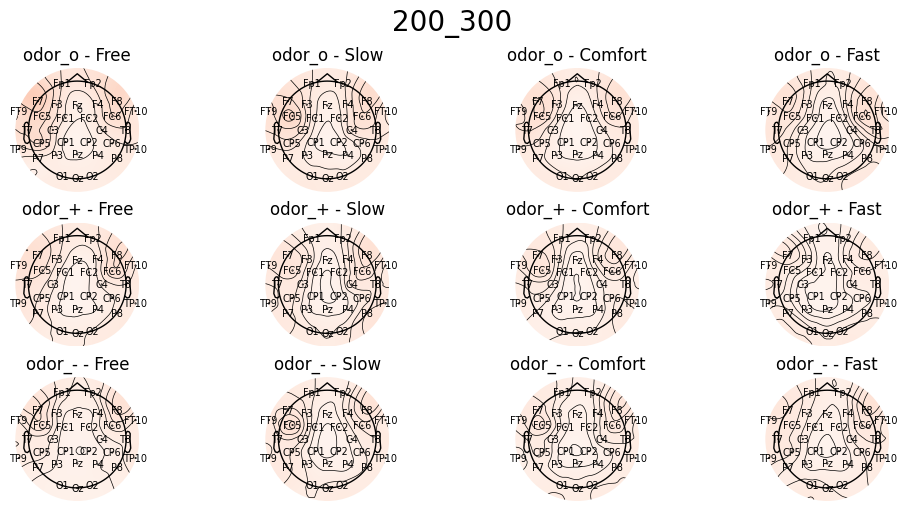

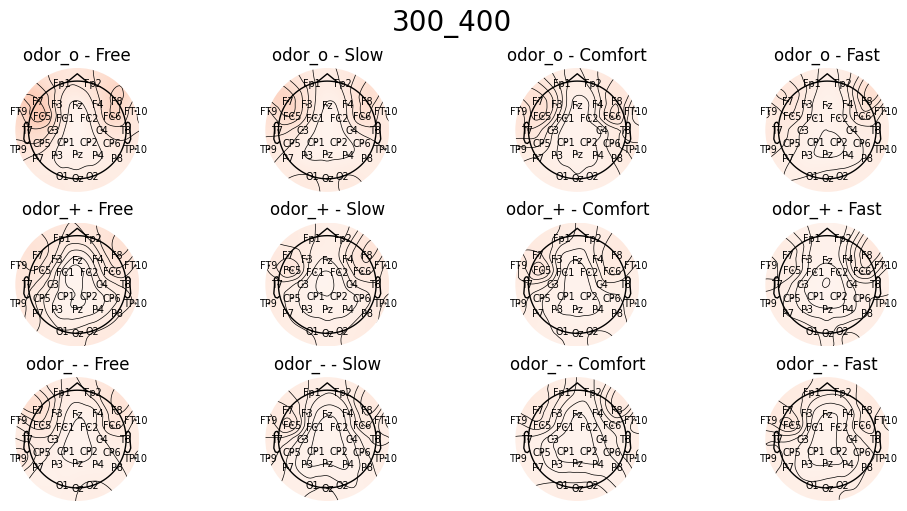

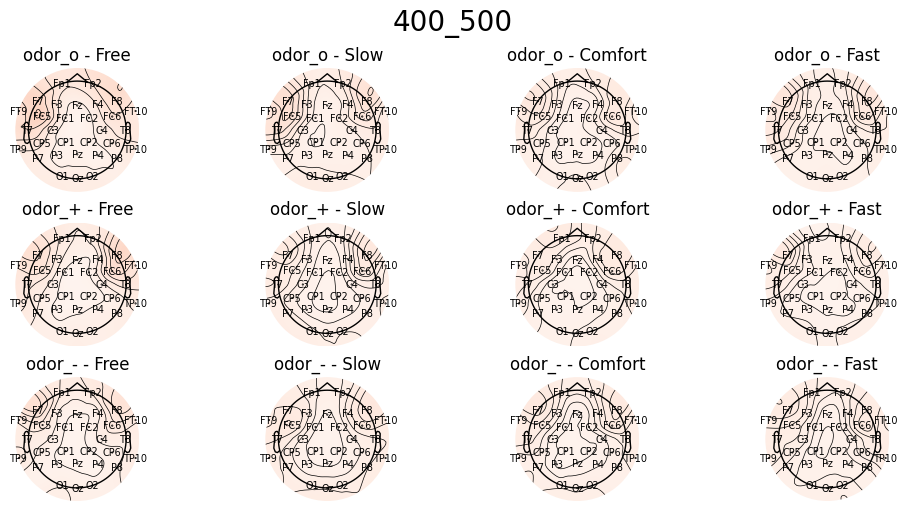

In [13]:
metric = 'mi_abs'
color = 'Reds'

for band in fbands.keys():
    
    band_hilbert_mi = hilbert_mi[hilbert_mi['band'] == band]
    
    delta = 0.005
    mini = band_hilbert_mi[metric].quantile(delta)
    maxi = band_hilbert_mi[metric].quantile(1 - delta)
    # borne_lim = np.max([np.abs(hilbert_mini),np.abs(maxi)])
    vlim = (mini,maxi)
    print(band, vlim)

    fig, axs = plt.subplots(nrows = len(odeurs), ncols = len(blocs),figsize = (10,5), constrained_layout = True)
    fig.suptitle(band, fontsize = 20)
    for r, odeur in enumerate(odeurs):
        for c, bloc in enumerate(blocs):
            ax = axs[r,c]
            mask = band_hilbert_mi[(band_hilbert_mi['odor'] == odeur) & (band_hilbert_mi['bloc'] == bloc)]
            data_ready = mask.groupby('chan').median(numeric_only = True)[metric].reindex(eeg_chans)
            data = data_ready.values
            im, cn = mne.viz.plot_topomap(data=data,pos = info, names = eeg_chans, axes=ax, show = False, vlim=vlim, cmap = color)
            ax.set_title(f'{odeur} - {bloc}')

delta (-0.1589173227137445, 0.11335171438029609)
theta (-0.12644233278877592, 0.07033549990455838)
alpha (-0.159185736806876, 0.08185349090914544)
beta (-0.09901937158139806, 0.05887012625477047)
low_gamma (-0.1652609505705019, 0.0783624241459891)
high_gamma (-0.23898094175235346, 0.10733167984939479)
100_200 (-0.27104540573464614, 0.11042232696553275)
200_300 (-0.23772838810661723, 0.10289159421049078)
300_400 (-0.20797863469542072, 0.0777111244583922)
400_500 (-0.18125694193935923, 0.06418246886250471)


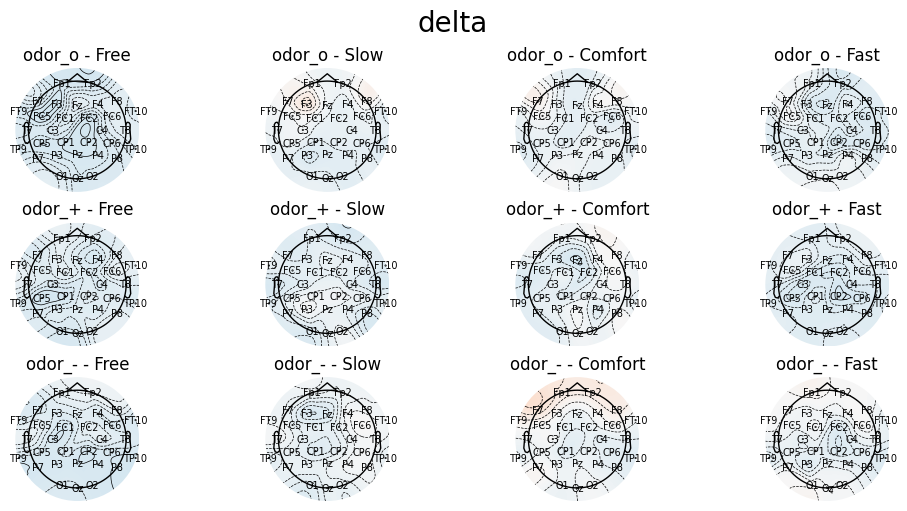

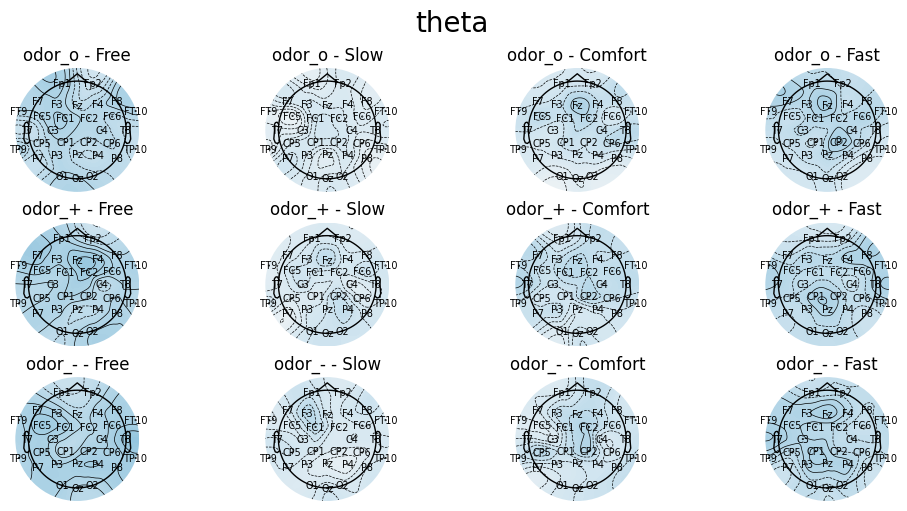

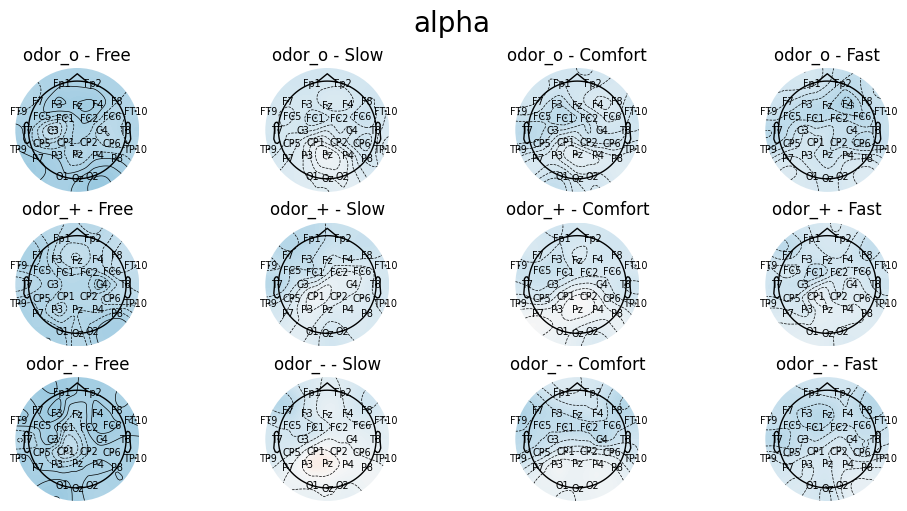

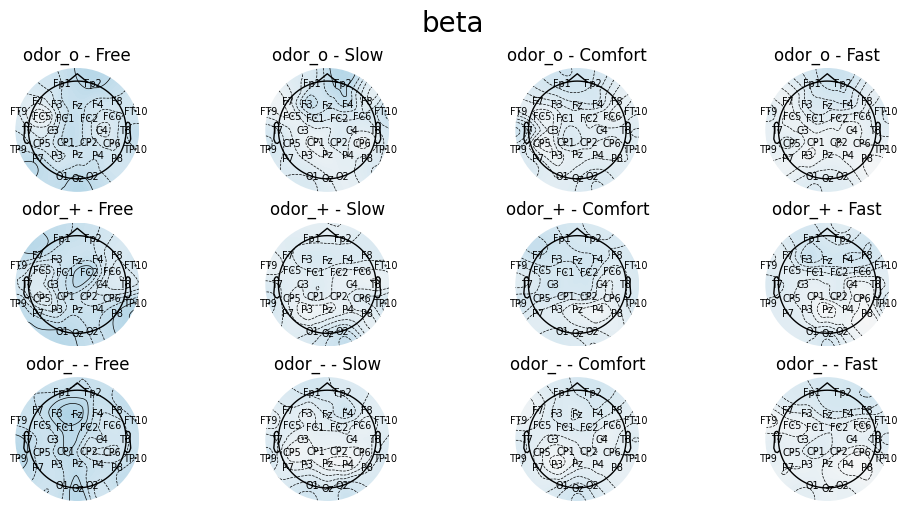

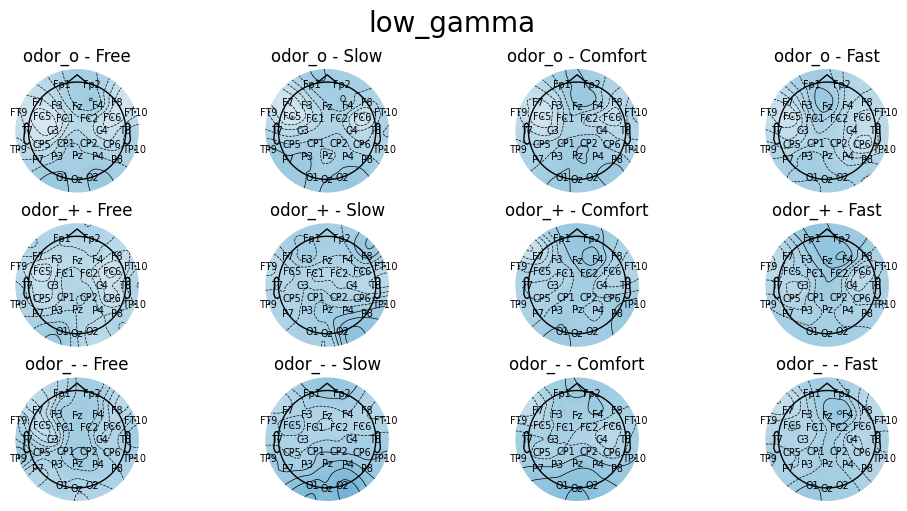

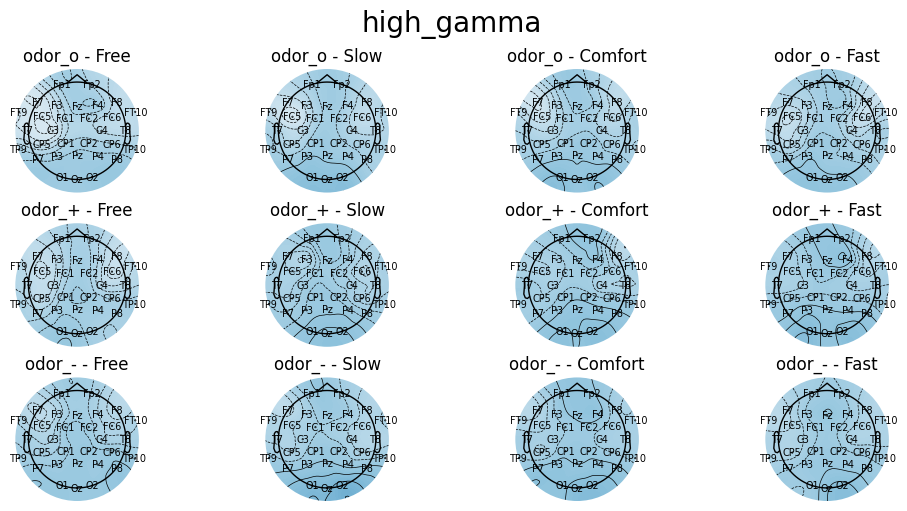

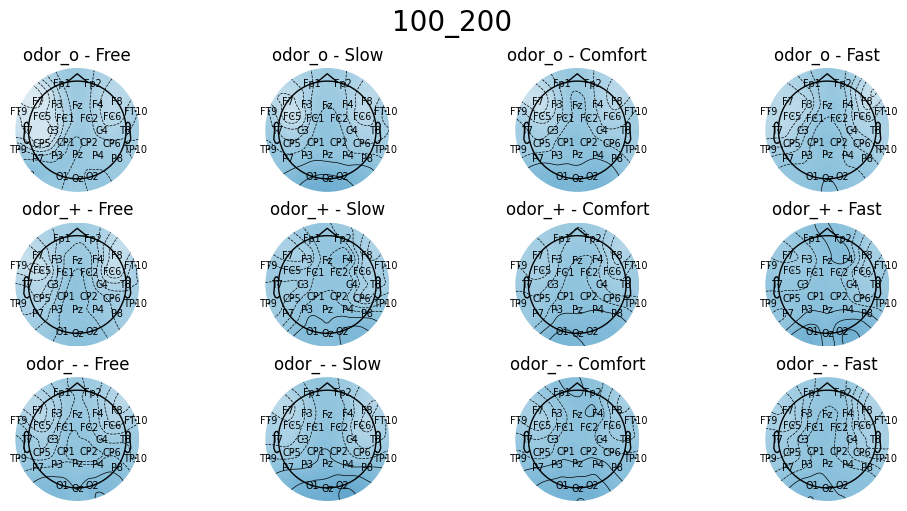

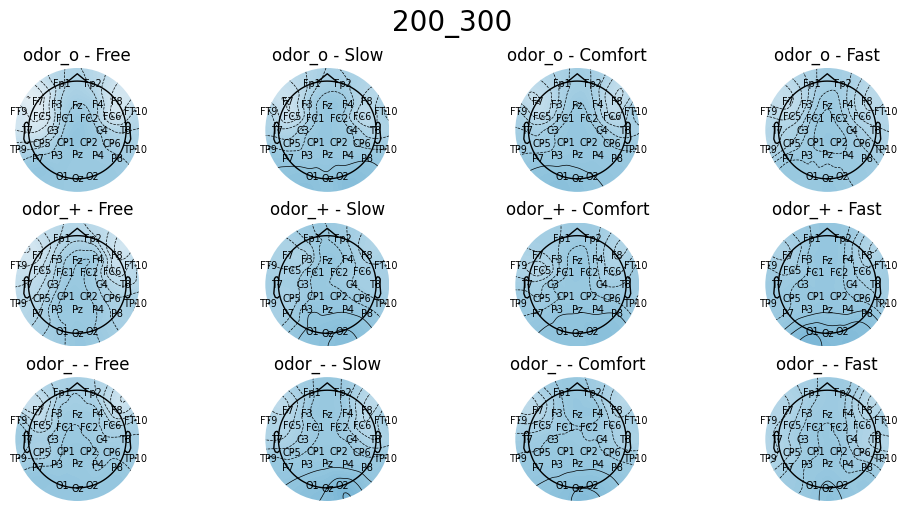

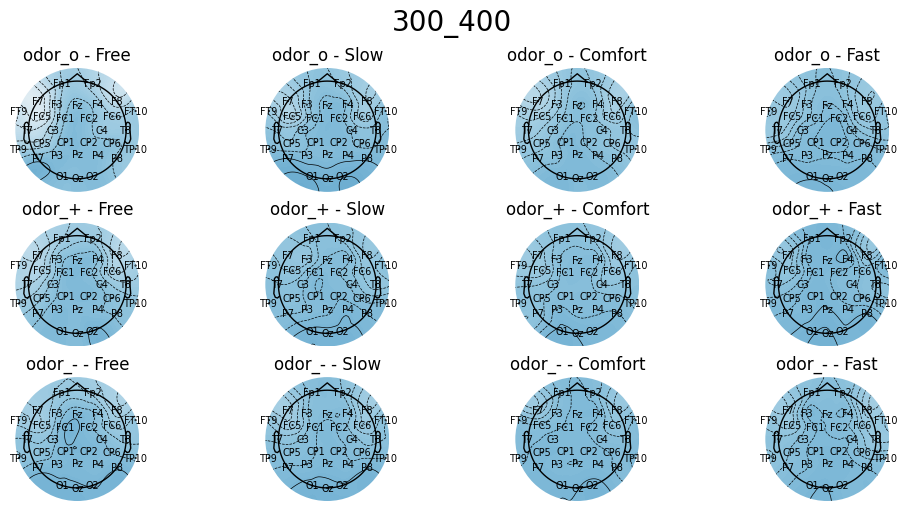

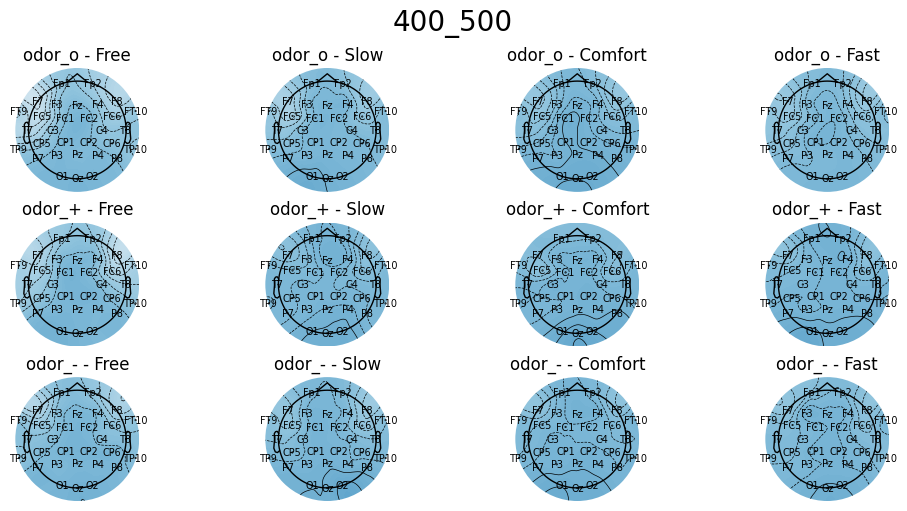

In [15]:
metric = 'mi_real_sum'
color = 'RdBu'

for band in fbands.keys():
    
    band_hilbert_mi = hilbert_mi[hilbert_mi['band'] == band]
    
    delta = 0.005
    mini = band_hilbert_mi[metric].quantile(delta)
    maxi = band_hilbert_mi[metric].quantile(1 - delta)
    # borne_lim = np.max([np.abs(hilbert_mini),np.abs(maxi)])
    vlim = (mini,maxi)
    print(band, vlim)

    fig, axs = plt.subplots(nrows = len(odeurs), ncols = len(blocs),figsize = (10,5), constrained_layout = True)
    fig.suptitle(band, fontsize = 20)
    for r, odeur in enumerate(odeurs):
        for c, bloc in enumerate(blocs):
            ax = axs[r,c]
            mask = band_hilbert_mi[(band_hilbert_mi['odor'] == odeur) & (band_hilbert_mi['bloc'] == bloc)]
            data_ready = mask.groupby('chan').median(numeric_only = True)[metric].reindex(eeg_chans)
            data = data_ready.values
            im, cn = mne.viz.plot_topomap(data=data,pos = info, names = eeg_chans, axes=ax, show = False, vlim=vlim, cmap = color)
            ax.set_title(f'{odeur} - {bloc}')

P01
delta (0.0004319136245648065, 0.29754964614597434)


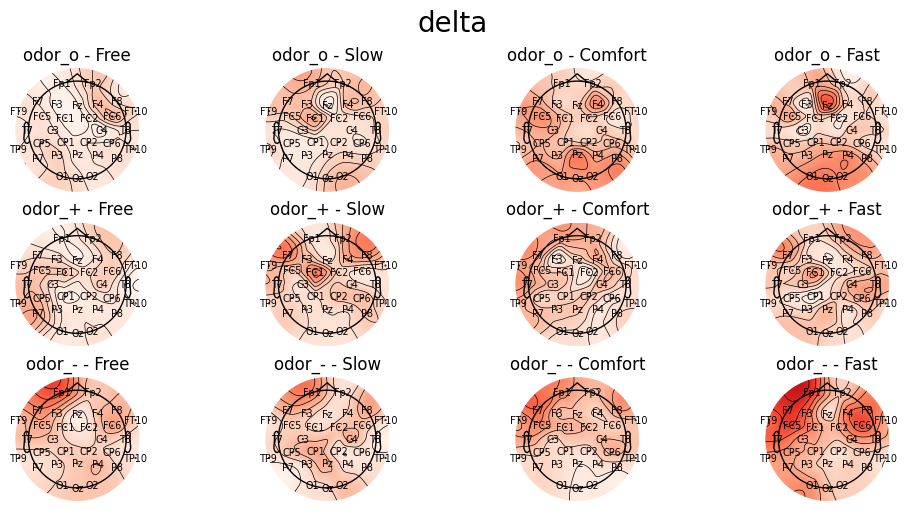

theta (0.000590687348401373, 0.19366955831806854)


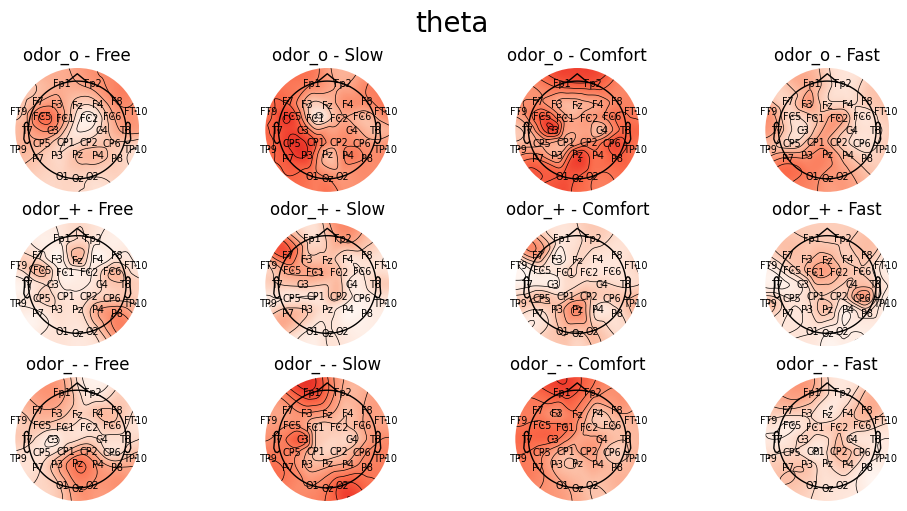

alpha (0.0004695768764872029, 0.20914000893464785)


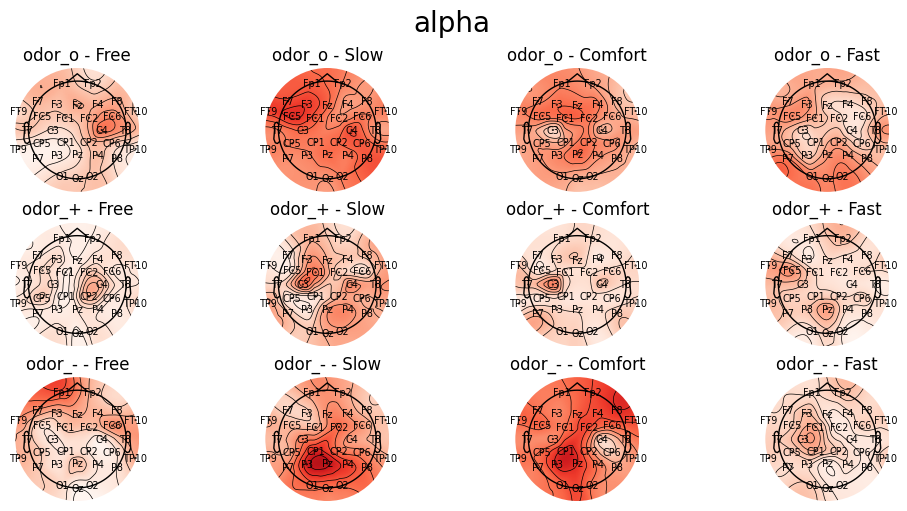

beta (0.0001377351996577262, 0.12041030094763176)


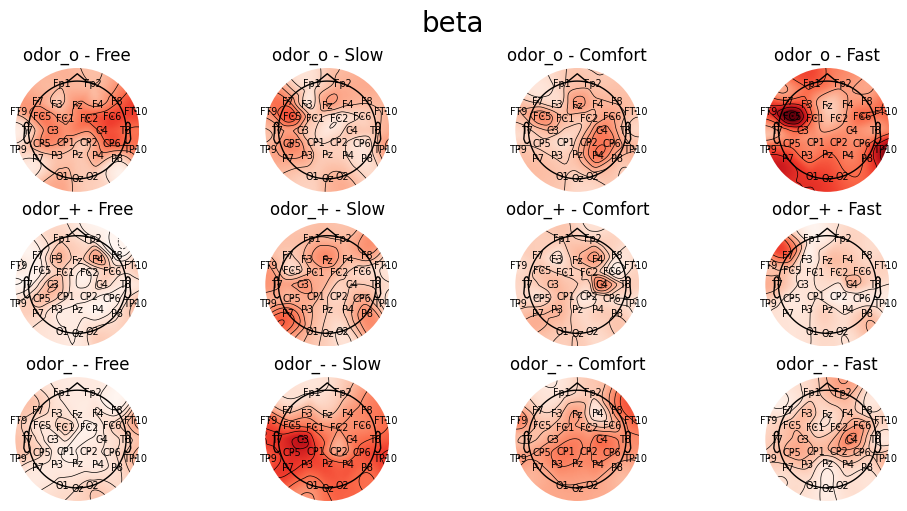

low_gamma (0.0003122168296645236, 0.2403027693021272)


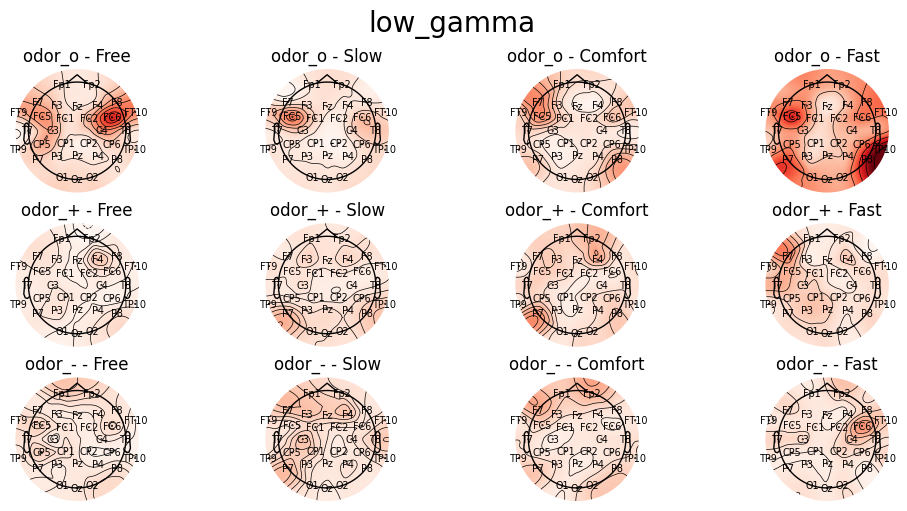

high_gamma (0.0003298793104443522, 0.4298337464492712)


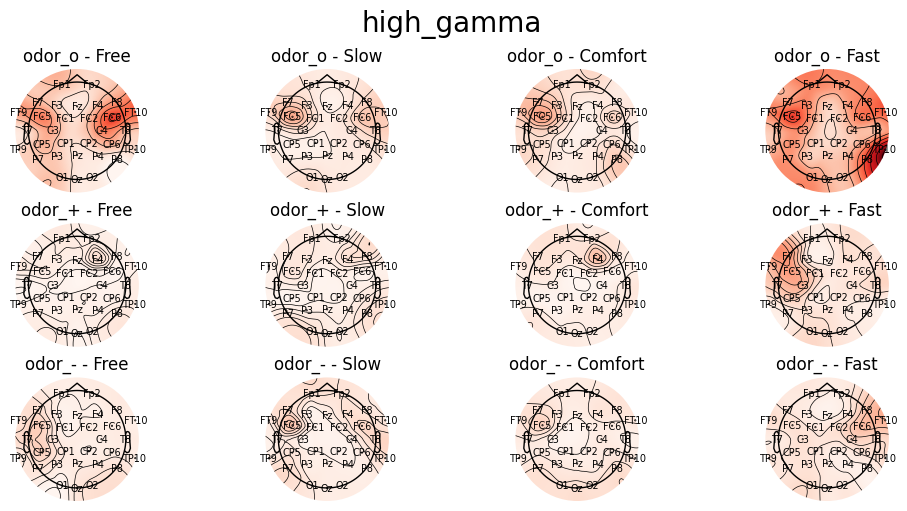

100_200 (0.00010788628663238564, 0.4192609569011694)


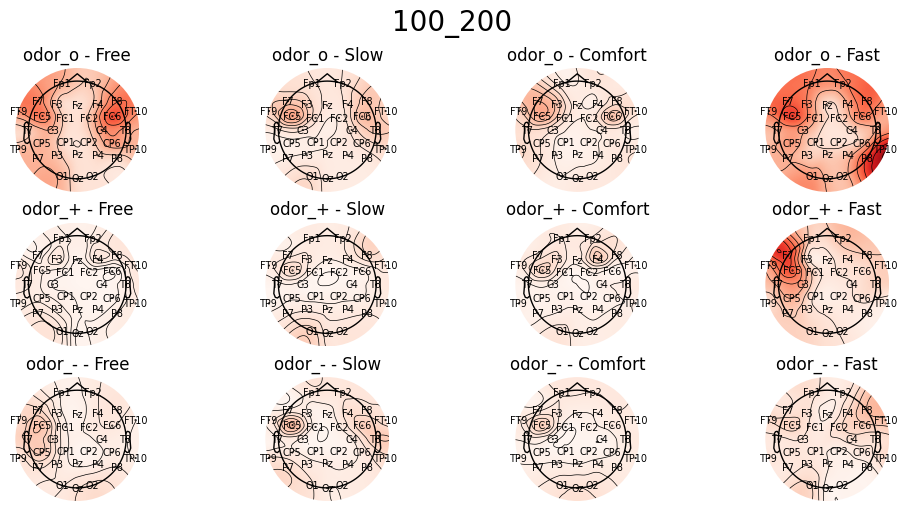

200_300 (0.00020594857871670516, 0.39638903745955933)


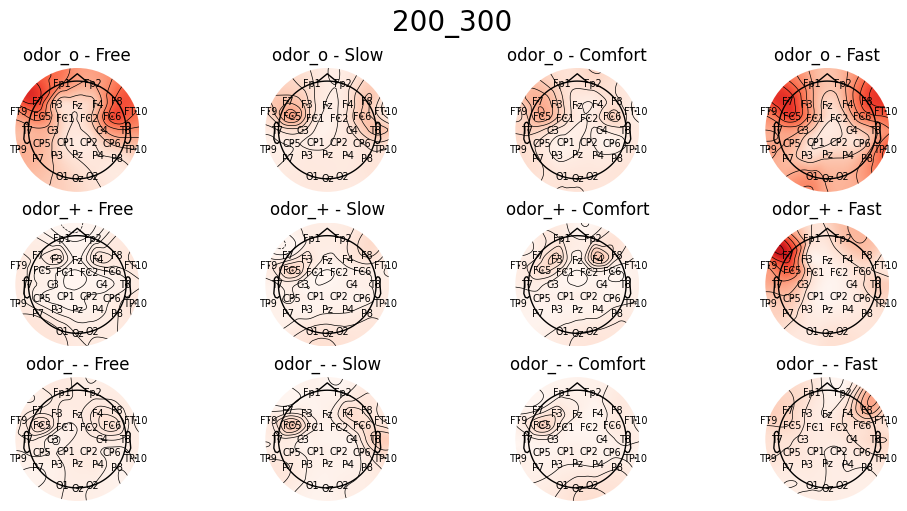

300_400 (0.0001666833714746787, 0.3491680844972309)


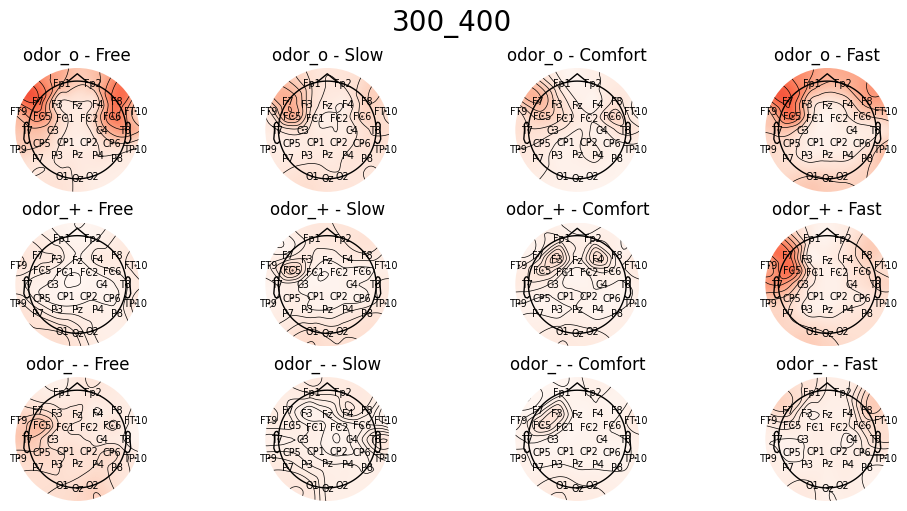

400_500 (0.00012310019124043924, 0.18934203946632366)


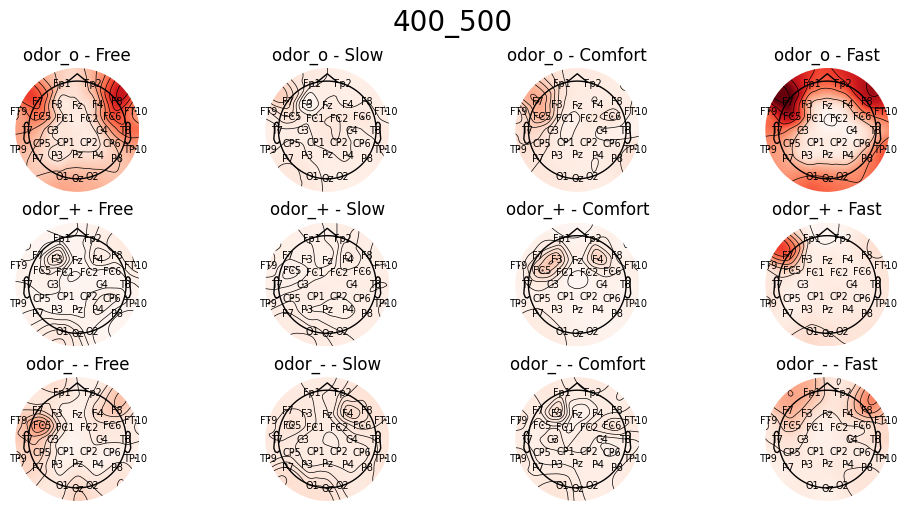

P03
delta (0.000641807663889021, 0.2819506739448443)


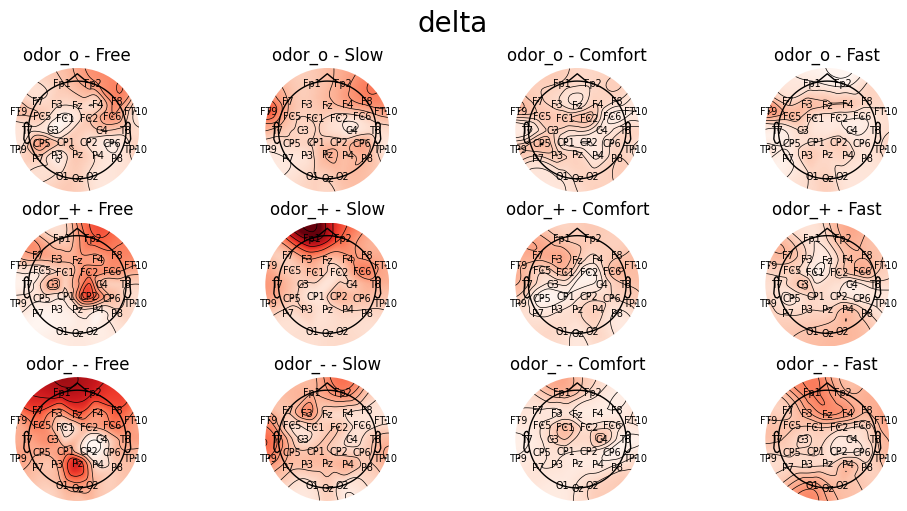

theta (0.0003252551954963595, 0.2141196661304408)


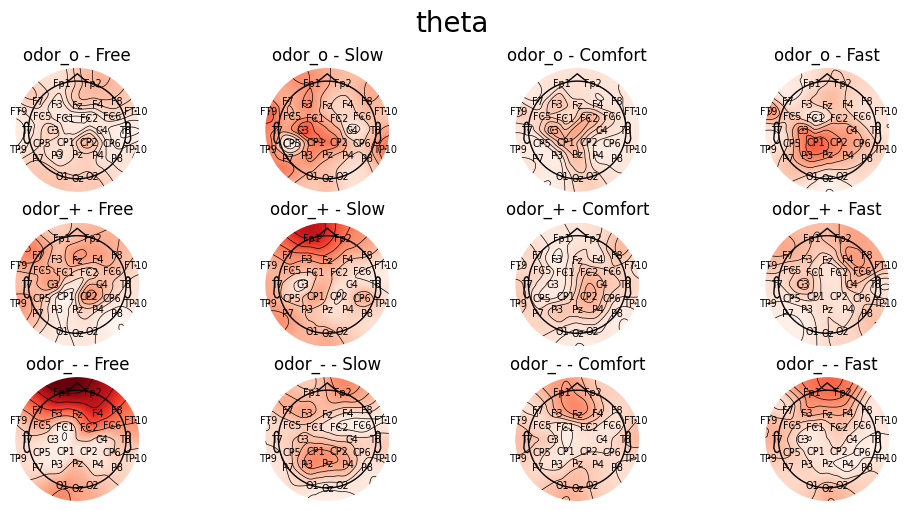

alpha (0.0005326920736290994, 0.2380646413442075)


KeyboardInterrupt: 

In [12]:
metric = 'mi_abs'
color = 'Reds'


for participant in hilbert_mi['participant'].unique():
    print(participant)
    
    hilbert_mi_participant = hilbert_mi[hilbert_mi['participant'] == participant]
    
    for band in fbands.keys():

        band_hilbert_mi = hilbert_mi_participant[hilbert_mi_participant['band'] == band]

        delta = 0.005
        mini = band_hilbert_mi[metric].quantile(delta)
        maxi = band_hilbert_mi[metric].quantile(1 - delta)
        # borne_lim = np.max([np.abs(hilbert_mini),np.abs(maxi)])
        vlim = (hilbert_mini,maxi)
        print(band, vlim)

        fig, axs = plt.subplots(nrows = len(odeurs), ncols = len(blocs),figsize = (10,5), constrained_layout = True)
        fig.suptitle(band, fontsize = 20)
        for r, odeur in enumerate(odeurs):
            for c, bloc in enumerate(blocs):
                ax = axs[r,c]
                mask = band_hilbert_mi[(band_hilbert_mi['odor'] == odeur) & (band_hilbert_mi['bloc'] == bloc)]
                data_ready = mask.groupby('chan').mean(numeric_only = True)[metric].reindex(eeg_chans)
                data = data_ready.values
                im, cn = mne.viz.plot_topomap(data=data,pos = info, names = eeg_chans, axes=ax, show = False, vlim=vlim, cmap = color)
                ax.set_title(f'{odeur} - {bloc}')
        plt.show()